# Imports

In [1]:
from PIL import Image, ImageDraw
from os import listdir, remove
from diffusers import StableDiffusionInpaintPipeline
from utils import image_grid, save_images, upscale_images

import torch

/home/shane/projects/.venv/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Parameters

In [2]:
image_folder = './saved_images/to_fix'
upscale_folder = './saved_images/to_upscale'
fixed_folder = './saved_images/fixed'
inpainting_model = "stabilityai/stable-diffusion-2-inpainting"

In [3]:
img_paths = [image_folder + "/" + m for m in listdir(image_folder)]
img_paths = sorted(img_paths)

In [5]:
# Select first image
img = img_paths[0]
img = "./saved_images/to_fix/0e3612ef064e60040f82a63612d05d4b.png"

In [6]:
pipe = StableDiffusionInpaintPipeline.from_pretrained(inpainting_model, torch_dtype=torch.float16).to("cuda")

/home/shane/projects/.venv/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
/home/shane/projects/.venv/lib/python3.10/site-packages/safetensors/torch.py:99: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  with safe_open(filename, framework="pt", device=device) as f:
/home/shane/projects/.venv/lib/python3.10/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStora

# Open image

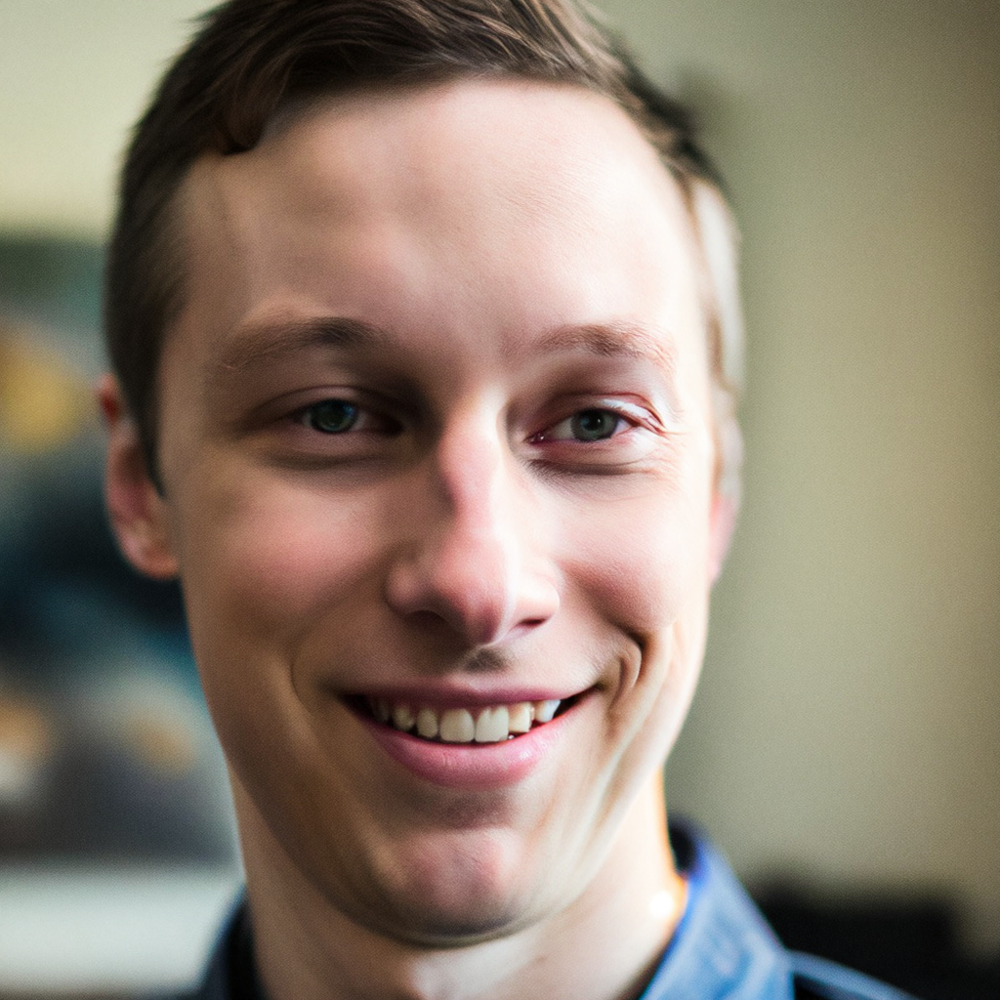

In [7]:
original_image = Image.open(img)
original_image

In [8]:
original_image.size

(1024, 1024)

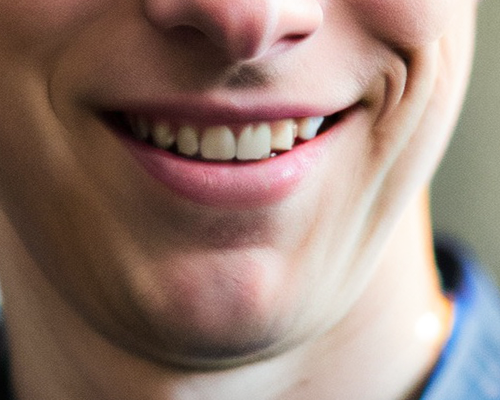

In [76]:
original_image.crop((250, 600, 750, 1000))

# Create Mask

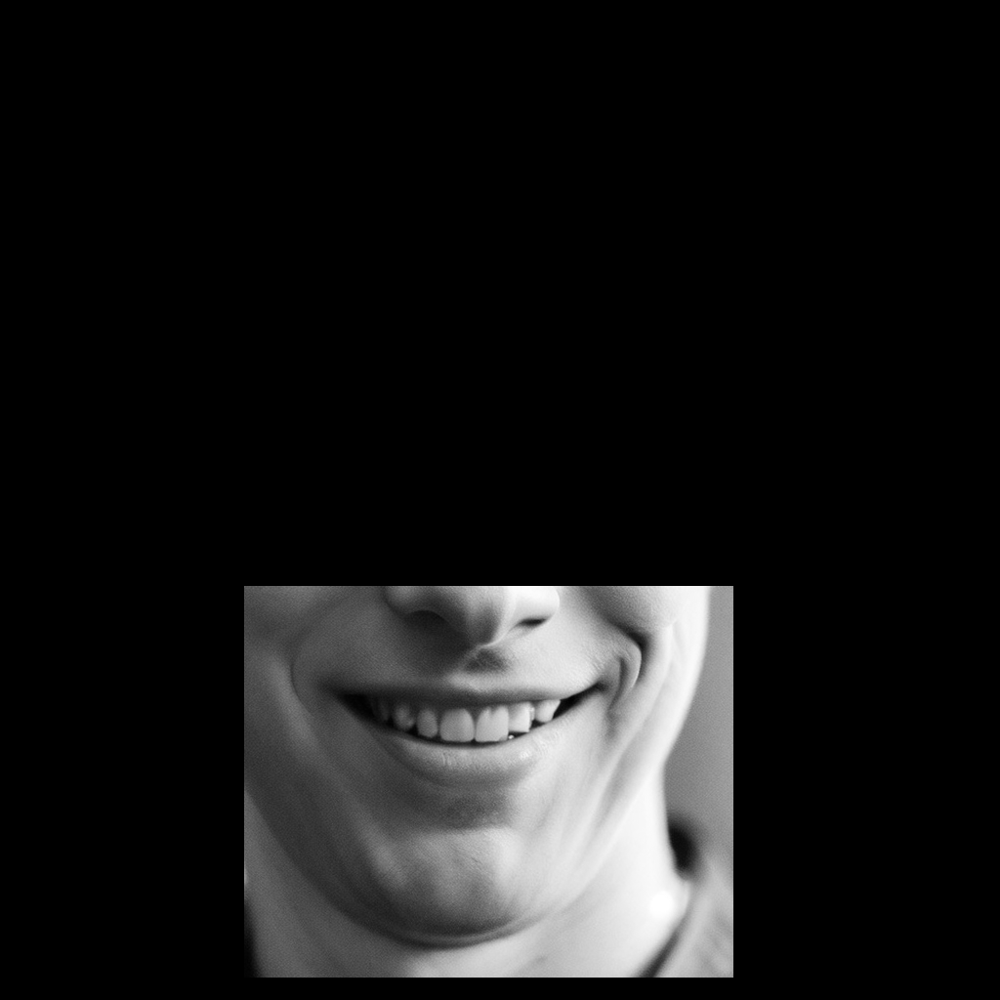

In [77]:
mask_image = Image.new("L", original_image.size, 0)
draw = ImageDraw.Draw(mask_image)
draw.rectangle((250, 600, 750, 1000), fill=255)
#draw.rectangle((520, 450, 650, 540), fill=255)
#draw.rectangle((400,650,600,750), fill=255)
#draw.ellipse((630, 680, 660, 720), fill=255)
Image.composite(original_image, mask_image, mask_image)

# Update image

In [58]:
saved_images = []

In [101]:
prompt = "a portrait photo of a shane man, handsome, smile, photograph, photorealistic, hard rim lighting photography--beta --ar 2:3  --beta --upbeta, well lit"
n_prompt = "bad, deformed, ugly, bad anatomy, cartoon, animated, scary, wrinkles, duplicate, double"
n_prompt +=  "eyebags, teeth, facial hair, beard, mustache, goatee, sideburns, moustache, stubble"
prompt += "clean shaven"

100%|██████████| 50/50 [00:04<00:00, 11.31it/s]


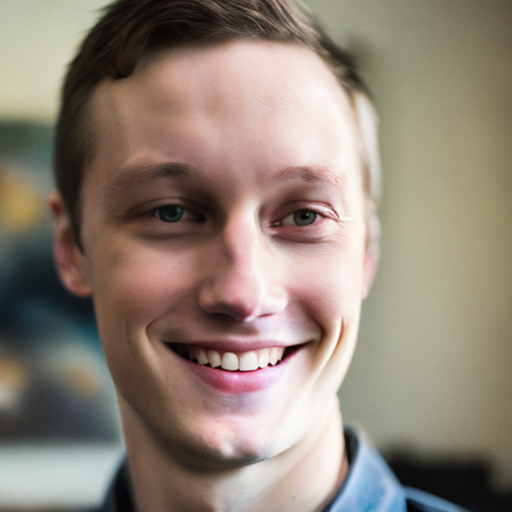

In [107]:
image = pipe(prompt=prompt, negative_prompt=n_prompt, num_inference_steps=50, guidance_scale=15, image=original_image.resize((512,512)), mask_image=mask_image.resize((512,512))).images[0]
image

In [89]:
saved_images.append(image)

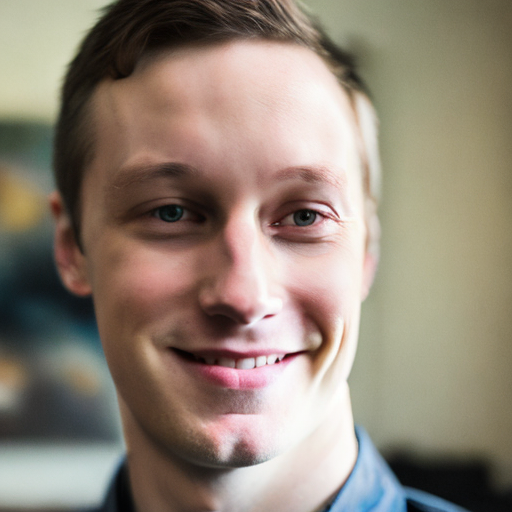

In [93]:
image_grid(saved_images)

In [108]:
save_images(saved_images, upscale_folder)

In [109]:
del pipe

# Upscale images

In [110]:
high_res_images = upscale_images(saved_images, prompt, n_prompt=n_prompt, num_inference_steps=25)

/home/shane/projects/.venv/lib/python3.10/site-packages/safetensors/torch.py:99: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  with safe_open(filename, framework="pt", device=device) as f:
/home/shane/projects/.venv/lib/python3.10/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
/home/shane/projects/.venv/lib/python3.10/site-packages/torch/storage.py:899: UserWarning: TypedStorage is deprecated. It will be removed in the future and Untype

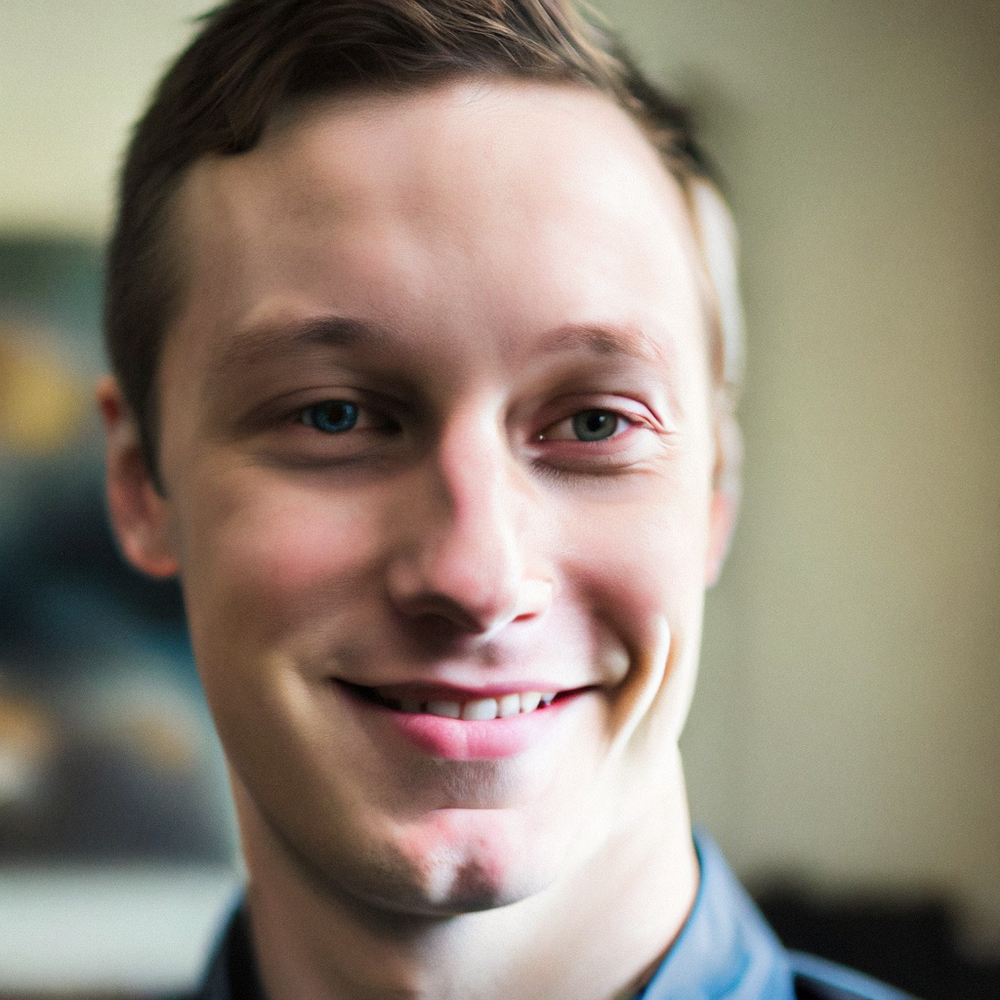

In [111]:
image_grid(high_res_images)

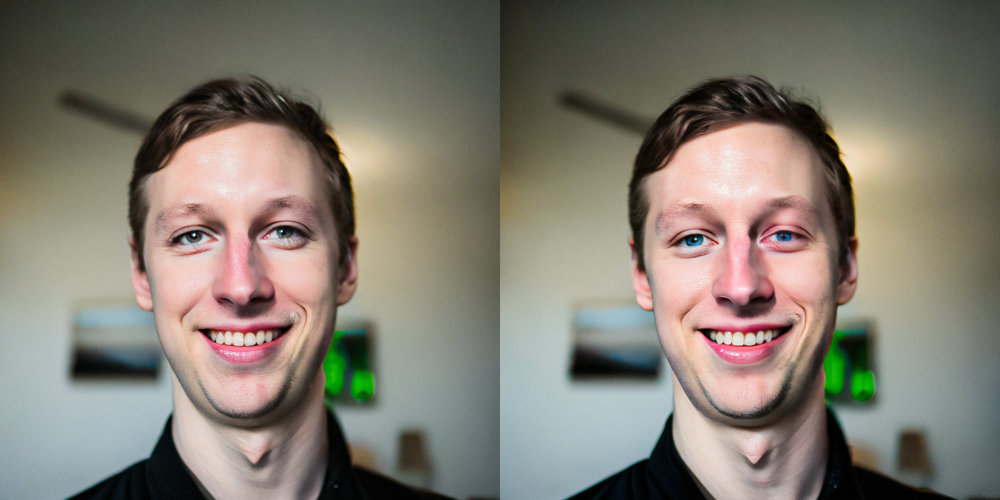

In [115]:
image_grid(high_res_images[1:3])

# Save image

In [112]:
[remove(upscale_folder + "/" + m) for m in listdir(upscale_folder)]

[None]

In [113]:
save_images([high_res_images[0]], fixed_folder)